In [66]:
import torch
import os
import pandas as pd
from torch.utils.data import Dataset, DataLoader
import torchvision.models as models
from torchvision  import transforms
import cv2


class ImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.labels = []

        class_names = [
            "arctic fox", "corgi", "electric ray", "goldfish", "hammerhead shark", 
            "horse", "hummingbird", "indigo finch", "puma", "red panda"
        ]

        for label, class_name in enumerate(class_names):
            class_dir = os.path.join(root_dir, class_name)
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                self.image_paths.append(img_path)
                self.labels.append(label)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label
    
batch_size = 64

preprocess = transforms.Compose([
    transforms.ToTensor(), 
    transforms.ConvertImageDtype(torch.float), 
    transforms.Resize((224, 224), antialias=True),   
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

class_names = [
    "arctic fox", "corgi", "electric ray", "goldfish", "hammerhead shark", 
    "horse", "hummingbird", "indigo finch", "puma", "red panda"
]
data_dir = "/home/walke/college/cv/ass2/CV Assignment 2/Q2/network visualization"

dataset = ImageDataset(root_dir=data_dir, transform=preprocess)

train_size = int(0.9 * len(dataset))

val_size = len(dataset) - train_size

train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

len(dataset)



50

In [67]:
from torchvision.models import resnet18, ResNet18_Weights
device = (
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)
print(f"Using {device} device")

weights = ResNet18_Weights.DEFAULT
model_trained = resnet18(weights=weights)

for param in model_trained.parameters():
    param.requires_grad = False

model_trained.fc = torch.nn.Linear(model_trained.fc.in_features, 10) 

model_trained.to(device)

Using cuda device


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [68]:
from tqdm import tqdm

def train_loop(dataloader, model, loss_fn, optimizer):
    total = len(dataloader)
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    train_loss, correct = 0, 0

    # Set the model to training mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.train()
    for batch, (X, y) in tqdm(enumerate(dataloader),desc="train", total = total):
        # Compute prediction and loss
        optimizer.zero_grad()
        
        X, y = X.to(device).float(), y.to(device)
        pred = model(X)
        loss = loss_fn(pred, y)
        train_loss += loss.item()

        # Backpropagation
        loss.backward()
        optimizer.step()
        

        correct += (pred.argmax(1) == y).type(torch.float).sum().item()


        if batch % 100 == 0:
            loss, current = loss.item(), batch * batch_size + len(X)


    train_loss /= num_batches
    correct /= size
    print(f"Training Error: \n Accuracy: {(100*correct):>0.1f}%, Avg Training loss: {train_loss:>8f} \n")
    
def test_loop(dataloader, model, loss_fn):
    # Set the model to evaluation mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    # model.load_state_dict(torch.load(model_path))

    model.eval()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss, correct = 0, 0

    # Evaluating the model with torch.no_grad() ensures that no gradients are computed during test mode
    # also serves to reduce unnecessary gradient computations and memory usage for tensors with requires_grad=True
    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device).float(), y.to(device)
            pred = model(X)
            test_loss += loss_fn(pred, y).item()
            
            # _, y = torch.argmax(y, dim=1)  
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()

    test_loss /= num_batches
    correct /= size
    print(f"Test Error: \n Accuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f} \n")


def val_loop(dataloader, model, loss_fn):

    model.eval()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    val_loss, correct = 0, 0

    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device).float(), y.to(device)
            pred = model(X)
            val_loss += loss_fn(pred, y).item()
            
            # _, y = torch.argmax(y, dim=1)  
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()

    val_loss /= num_batches
    correct /= size
    print(f"Validation Error: \n Accuracy: {(100*correct):>0.1f}%, Avg Validation loss: {val_loss:>8f} \n")

    return correct

In [69]:

learning_rate = 1e-3
batch_size = 16
epochs = 7

loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_trained.parameters(), lr=learning_rate)

val_accuracy_highest = 0
val_accuracy_curr = 0

for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train_loop(train_dataloader, model_trained, loss_fn, optimizer)
    val_accuracy_curr = val_loop(val_dataloader, model_trained, loss_fn)
print("Done!")


Epoch 1
-------------------------------


train: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Training Error: 
 Accuracy: 4.4%, Avg Training loss: 2.594111 

Validation Error: 
 Accuracy: 0.0%, Avg Validation loss: 2.694973 

Epoch 2
-------------------------------


train: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]


Training Error: 
 Accuracy: 8.9%, Avg Training loss: 2.345641 

Validation Error: 
 Accuracy: 0.0%, Avg Validation loss: 2.590490 

Epoch 3
-------------------------------


train: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]


Training Error: 
 Accuracy: 22.2%, Avg Training loss: 2.137934 

Validation Error: 
 Accuracy: 20.0%, Avg Validation loss: 2.488753 

Epoch 4
-------------------------------


train: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Training Error: 
 Accuracy: 42.2%, Avg Training loss: 1.953507 

Validation Error: 
 Accuracy: 20.0%, Avg Validation loss: 2.378396 

Epoch 5
-------------------------------


train: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


Training Error: 
 Accuracy: 55.6%, Avg Training loss: 1.781201 

Validation Error: 
 Accuracy: 20.0%, Avg Validation loss: 2.253681 

Epoch 6
-------------------------------


train: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Training Error: 
 Accuracy: 68.9%, Avg Training loss: 1.616141 

Validation Error: 
 Accuracy: 40.0%, Avg Validation loss: 2.119224 

Epoch 7
-------------------------------


train: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

Training Error: 
 Accuracy: 80.0%, Avg Training loss: 1.457544 

Validation Error: 
 Accuracy: 60.0%, Avg Validation loss: 1.977857 

Done!


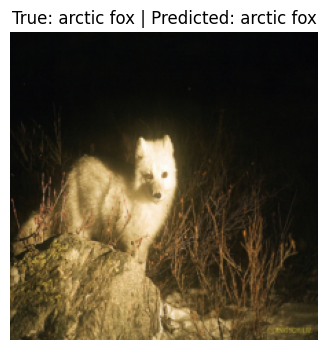

Class Probabilities: [0.31375697 0.24470906 0.11527729 0.06706129 0.04428998 0.04290098
 0.02074259 0.04430437 0.05585927 0.05109813]


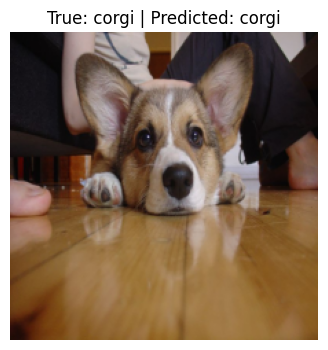

Class Probabilities: [0.09461418 0.198165   0.08433957 0.07166507 0.05781825 0.17162052
 0.07649558 0.08787078 0.11377145 0.04363953]


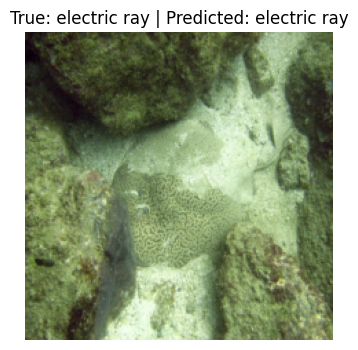

Class Probabilities: [0.05978241 0.07274324 0.1984785  0.09336708 0.17266408 0.05489061
 0.03466973 0.05364482 0.1423428  0.11741675]


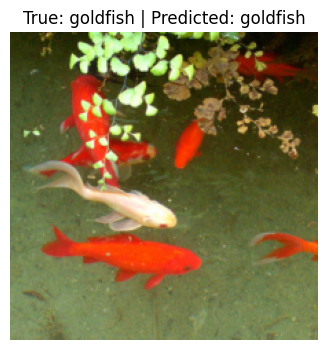

Class Probabilities: [0.04803775 0.10263608 0.06046262 0.42919537 0.16780521 0.04376429
 0.03308485 0.03669587 0.06439011 0.01392793]


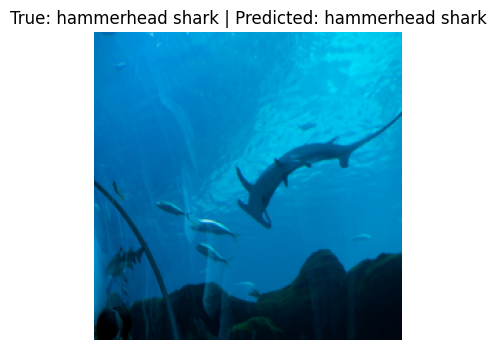

Class Probabilities: [0.07730923 0.08116134 0.04324397 0.08273505 0.2598493  0.11415446
 0.0901513  0.04830123 0.08562566 0.11746853]


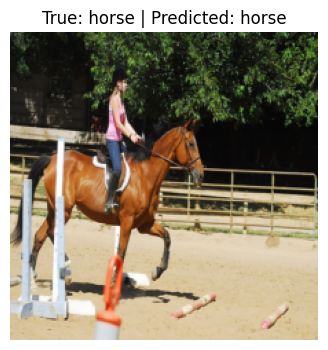

Class Probabilities: [0.10037897 0.04839919 0.04130433 0.1166291  0.05344252 0.36712795
 0.07797707 0.06261037 0.06875063 0.0633799 ]


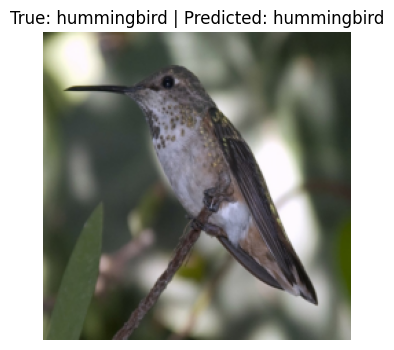

Class Probabilities: [0.06757745 0.15552962 0.03192172 0.07914062 0.03164545 0.10002057
 0.24713203 0.11919684 0.07811943 0.08971624]


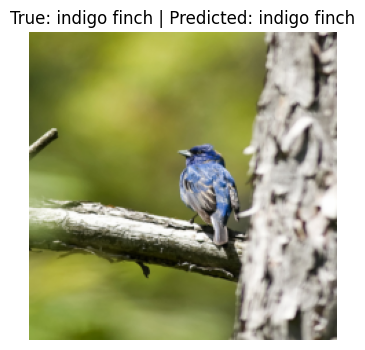

Class Probabilities: [0.08724898 0.0716477  0.03117769 0.09805389 0.06748936 0.08013356
 0.22356507 0.24659908 0.04942112 0.04466343]


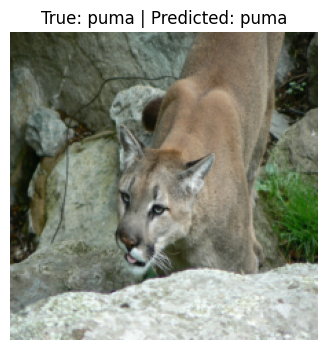

Class Probabilities: [0.1681328  0.09067217 0.0744428  0.04529595 0.04094596 0.06604513
 0.07673472 0.03417267 0.3340201  0.06953775]


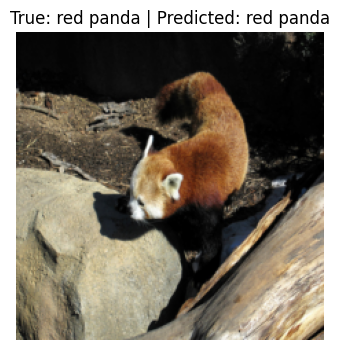

Class Probabilities: [0.0974444  0.07400405 0.06035098 0.06625368 0.07787536 0.10549457
 0.06000547 0.06596712 0.05192576 0.3406786 ]


In [70]:
import numpy as np

selected_images = {}
for idx, (img, label) in enumerate(dataset):
    if label not in selected_images:
        selected_images[label] = (img, label)
    if len(selected_images) == len(class_names):
        break


import matplotlib.pyplot as plt

model_trained.eval()
with torch.no_grad():
    for label, (image, true_label) in selected_images.items():

        image = image.unsqueeze(0).to(device)
        logits = model_trained(image)
        probs = torch.nn.functional.softmax(logits, dim=1)
        predicted_label = torch.argmax(probs, dim=1).item()

        img = image.squeeze(0).permute(1, 2, 0).cpu().numpy()
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = (img * 255).clip(0, 255).astype('uint8')


        plt.figure(figsize=(6, 4))
        plt.imshow(img)
        plt.title(f"True: {class_names[true_label]} | Predicted: {class_names[predicted_label]}")
        plt.axis('off')
        plt.show()

        print(f"Class Probabilities: {probs.cpu().numpy().flatten()}")


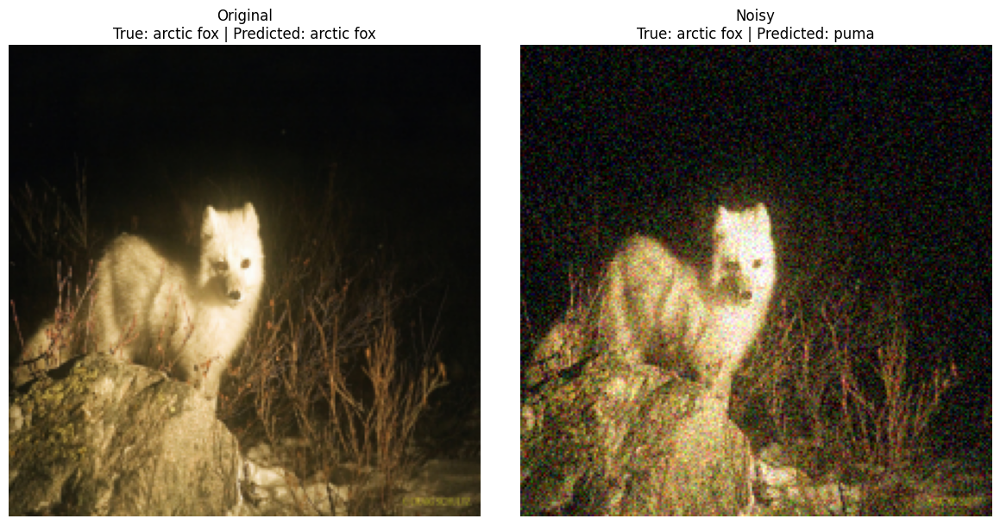

Original class probabilities: [0.31375697 0.24470906 0.11527729 0.06706129 0.04428998 0.04290098
 0.02074259 0.04430437 0.05585927 0.05109813]
Noisy class probabilities: [0.1299921  0.08987836 0.11299413 0.11712351 0.08801456 0.0754964
 0.06664583 0.06539924 0.13745373 0.11700222]


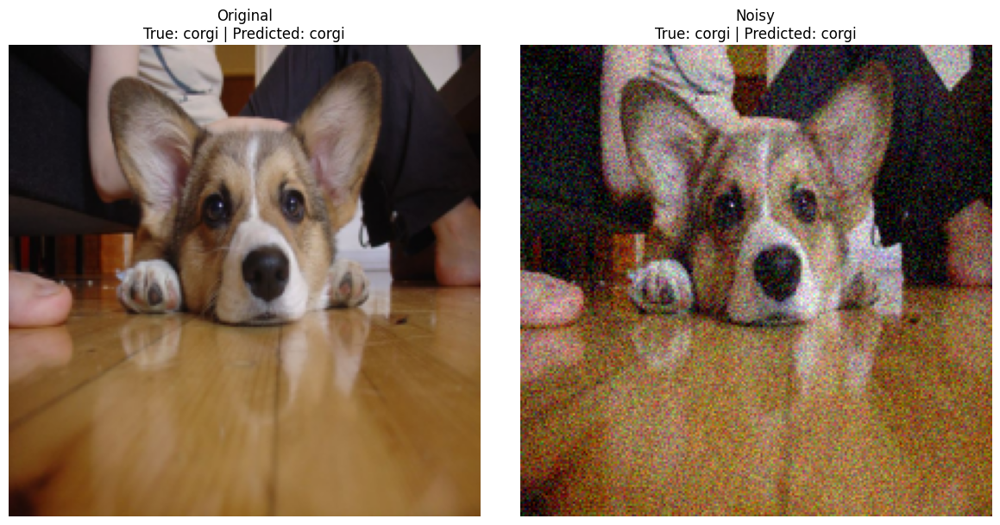

Original class probabilities: [0.09461418 0.198165   0.08433957 0.07166507 0.05781825 0.17162052
 0.07649558 0.08787078 0.11377145 0.04363953]
Noisy class probabilities: [0.11244556 0.24172175 0.05520155 0.09338112 0.11542567 0.11939481
 0.07691637 0.08709711 0.06299494 0.03542108]


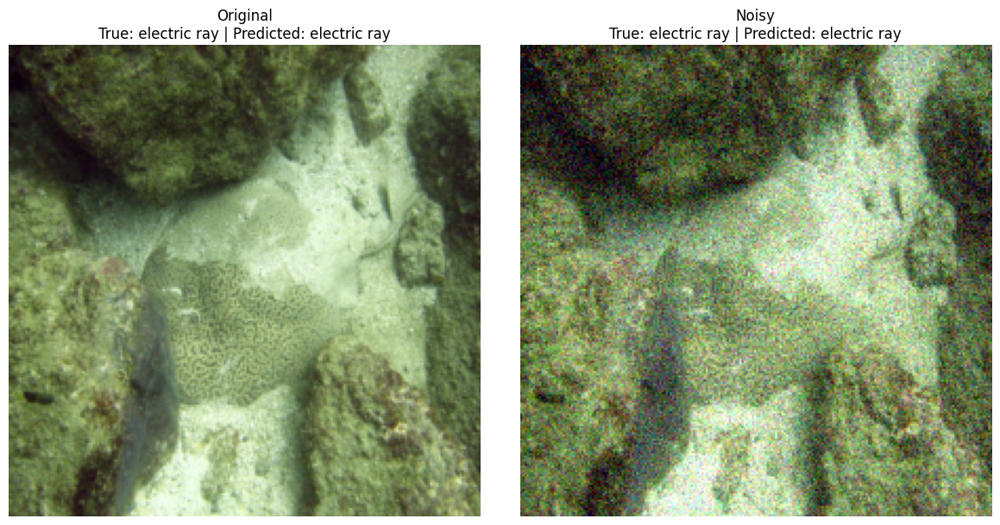

Original class probabilities: [0.05978241 0.07274324 0.1984785  0.09336708 0.17266408 0.05489061
 0.03466973 0.05364482 0.1423428  0.11741675]
Noisy class probabilities: [0.0957089  0.08176883 0.15717056 0.09936202 0.13342142 0.08515313
 0.03781847 0.0608502  0.10664134 0.14210512]


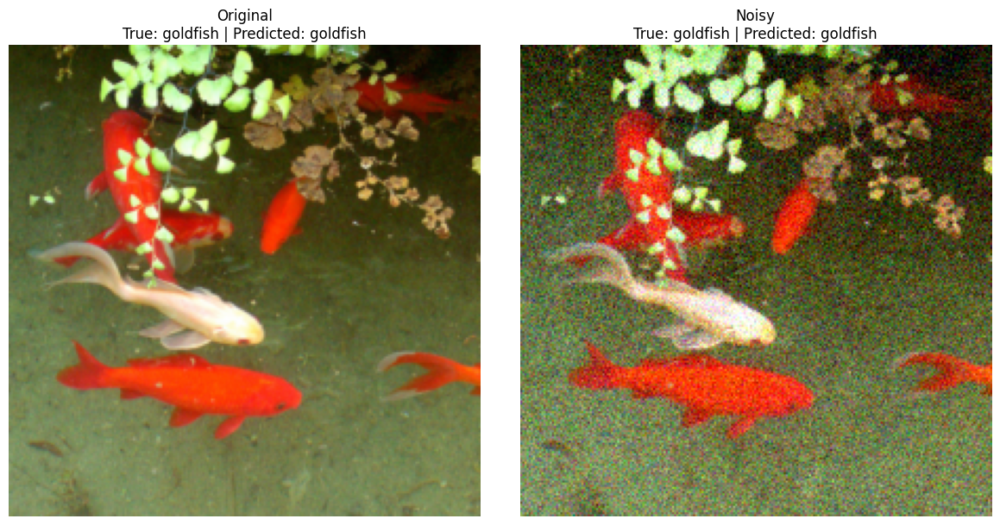

Original class probabilities: [0.04803775 0.10263608 0.06046262 0.42919537 0.16780521 0.04376429
 0.03308485 0.03669587 0.06439011 0.01392793]
Noisy class probabilities: [0.05512314 0.07812543 0.07343327 0.48747772 0.12582323 0.03151116
 0.03073513 0.04724503 0.04973588 0.02079007]


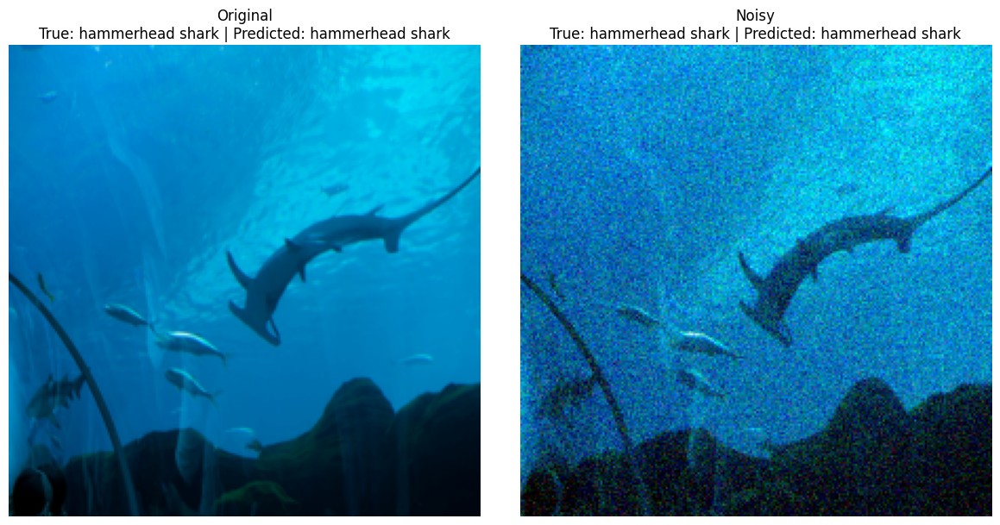

Original class probabilities: [0.07730923 0.08116134 0.04324397 0.08273505 0.2598493  0.11415446
 0.0901513  0.04830123 0.08562566 0.11746853]
Noisy class probabilities: [0.09804528 0.0898339  0.09088081 0.12898348 0.16552518 0.10811575
 0.0659074  0.0501722  0.11167535 0.09086058]


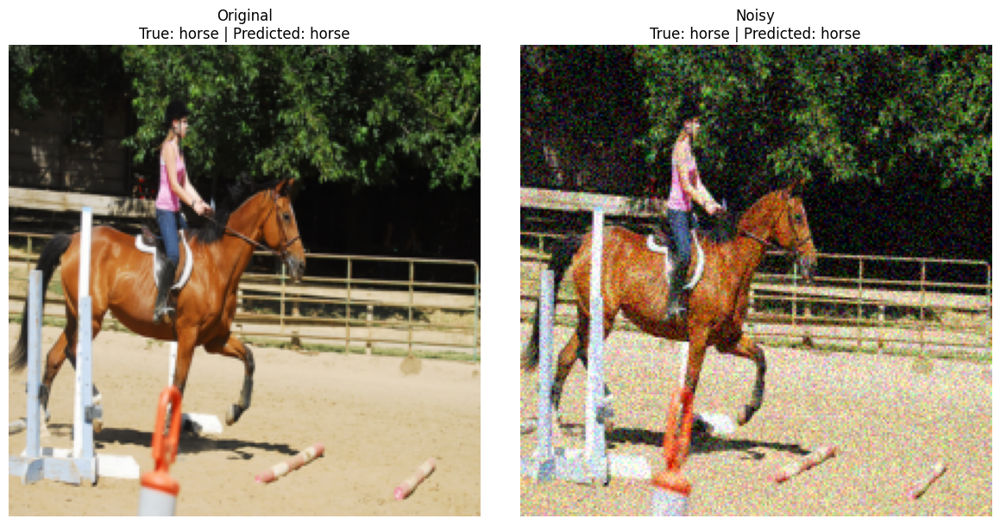

Original class probabilities: [0.10037897 0.04839919 0.04130433 0.1166291  0.05344252 0.36712795
 0.07797707 0.06261037 0.06875063 0.0633799 ]
Noisy class probabilities: [0.131162   0.0955302  0.02694836 0.12693264 0.10932484 0.2926794
 0.0550149  0.04859639 0.0701974  0.04361385]


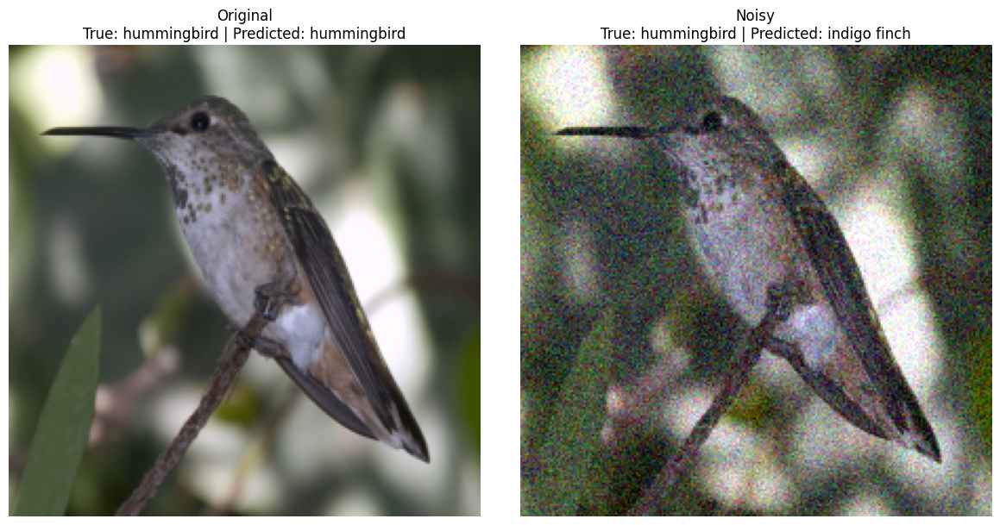

Original class probabilities: [0.06757745 0.15552962 0.03192172 0.07914062 0.03164545 0.10002057
 0.24713203 0.11919684 0.07811943 0.08971624]
Noisy class probabilities: [0.12753999 0.10146334 0.03186028 0.06980358 0.06654084 0.08826804
 0.13649754 0.17387177 0.0581997  0.14595494]


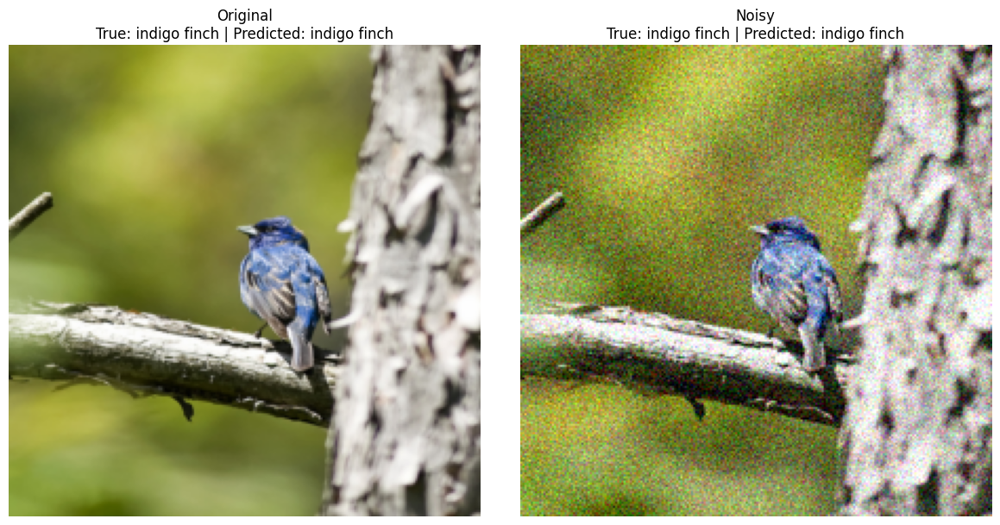

Original class probabilities: [0.08724898 0.0716477  0.03117769 0.09805389 0.06748936 0.08013356
 0.22356507 0.24659908 0.04942112 0.04466343]
Noisy class probabilities: [0.13192376 0.06758213 0.02199137 0.09842439 0.06929737 0.0416871
 0.20839953 0.26400155 0.03905834 0.05763442]


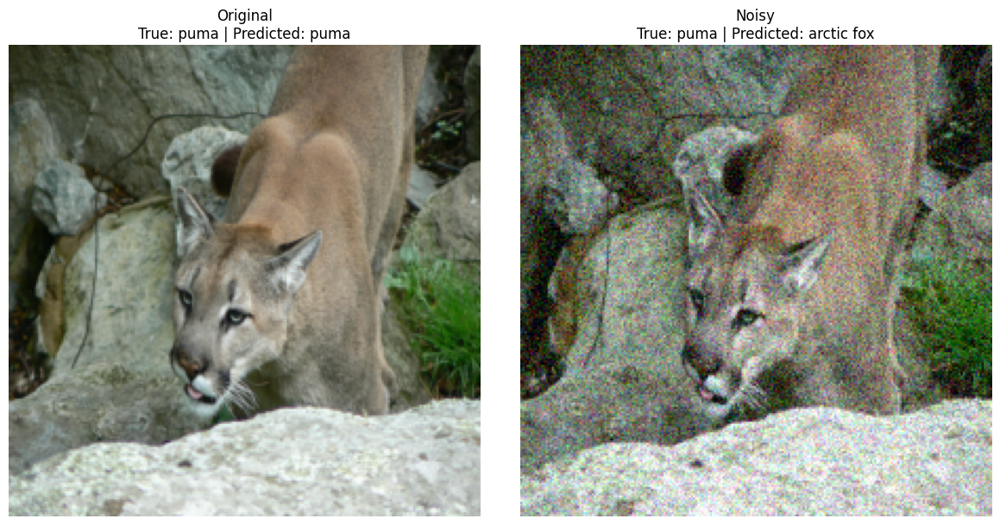

Original class probabilities: [0.1681328  0.09067217 0.0744428  0.04529595 0.04094596 0.06604513
 0.07673472 0.03417267 0.3340201  0.06953775]
Noisy class probabilities: [0.21428403 0.05585225 0.10192837 0.07086161 0.09440041 0.06147087
 0.08392809 0.03697878 0.19242777 0.08786774]


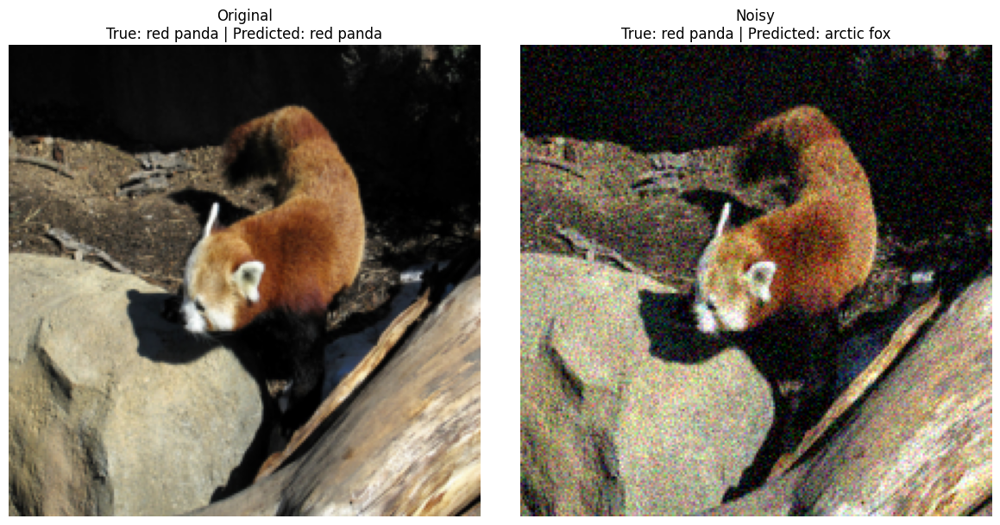

Original class probabilities: [0.0974444  0.07400405 0.06035098 0.06625368 0.07787536 0.10549457
 0.06000547 0.06596712 0.05192576 0.3406786 ]
Noisy class probabilities: [0.15867913 0.14783505 0.06941012 0.04721195 0.07468899 0.07532853
 0.09190716 0.13213818 0.08210767 0.1206932 ]


In [71]:
import numpy as np
import matplotlib.pyplot as plt

with torch.no_grad():
    for key, (image, true_label) in selected_images.items():
        image = image.unsqueeze(0).to(device)

        logits = model_trained(image)
        probs = torch.nn.functional.softmax(logits, dim=1)
        predicted_label = torch.argmax(probs, dim=1).item()
        
        noise_std = 0.4
        noisy_image = image + torch.randn_like(image) * noise_std
        
        logits_noisy = model_trained(noisy_image)
        probs_noisy = torch.nn.functional.softmax(logits_noisy, dim=1)
        predicted_label_noisy = torch.argmax(probs_noisy, dim=1).item()
        
        orig_img = image.squeeze(0).permute(1, 2, 0).cpu().numpy()
        orig_img = orig_img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        orig_img = (orig_img * 255).clip(0, 255).astype('uint8')
        
        noisy_img = noisy_image.squeeze(0).permute(1, 2, 0).cpu().numpy()
        noisy_img = noisy_img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        noisy_img = (noisy_img * 255).clip(0, 255).astype('uint8')
        
        plt.figure(figsize=(12, 6))
        
        plt.subplot(1, 2, 1)
        plt.imshow(orig_img)
        plt.title(f"Original\nTrue: {class_names[true_label]} | Predicted: {class_names[predicted_label]}")
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(noisy_img)
        plt.title(f"Noisy\nTrue: {class_names[true_label]} | Predicted: {class_names[predicted_label_noisy]}")
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()

        print("Original class probabilities:", probs.cpu().numpy().flatten())
        print("Noisy class probabilities:", probs_noisy.cpu().numpy().flatten())


In [72]:
def compute_saliency_map(image, label, model=model_trained, device=device):
    model.eval()
    image = image.unsqueeze(0).to(device).requires_grad_(True)


    logits = model(image)
    score = logits[0, label]


    model.zero_grad()
    score.backward()

    saliency = image.grad.abs().squeeze().max(dim=0)[0].detach().cpu()

    return saliency


In [73]:
def next_highest(image, model=model_trained, device=device, num_epochs=10, learning_rate=0.01):

    input= image.clone().detach().cpu()

    model.eval()
    with torch.no_grad():
        image_tensor = input.unsqueeze(0).to(device)
        logits = model(image_tensor)
        probs = torch.nn.functional.softmax(logits, dim=1)[0] 
        true_class = torch.argsort(probs, descending=True)[0].item()
        next_highest_class = torch.argsort(probs, descending=True)[1].item()  # Second highest probability class

     
    modified_image = input.clone().to(device)
    modified_image.requires_grad_(True)
    
    with torch.no_grad():
        logits = model(modified_image.unsqueeze(0))
        original_pred = logits.argmax(dim=1).item()
    
    orig_min = input.min().item()
    orig_max = input.max().item()

    optimizer = torch.optim.Adam([modified_image], lr=learning_rate)
    
    for epoch in range(num_epochs):
        logits = model(modified_image.unsqueeze(0))
        loss = -logits[0, next_highest_class]
        

        model.zero_grad()
        loss.backward()
        

        optimizer.step()
        
        # Optional
        with torch.no_grad():
            modified_image.clamp_(orig_min, orig_max)
    
    with torch.no_grad():
        logits = model(modified_image.unsqueeze(0))
        final_pred = logits.argmax(dim=1).item()
    
    return modified_image.detach(), original_pred, final_pred, true_class, next_highest_class

import random 

image, label = selected_images[ random.choice(list(selected_images.keys()))]

modified, orig_pred_next, final_pred_next, true_class, next_highest_class = next_highest(image, model=model_trained, device=device, num_epochs=10)

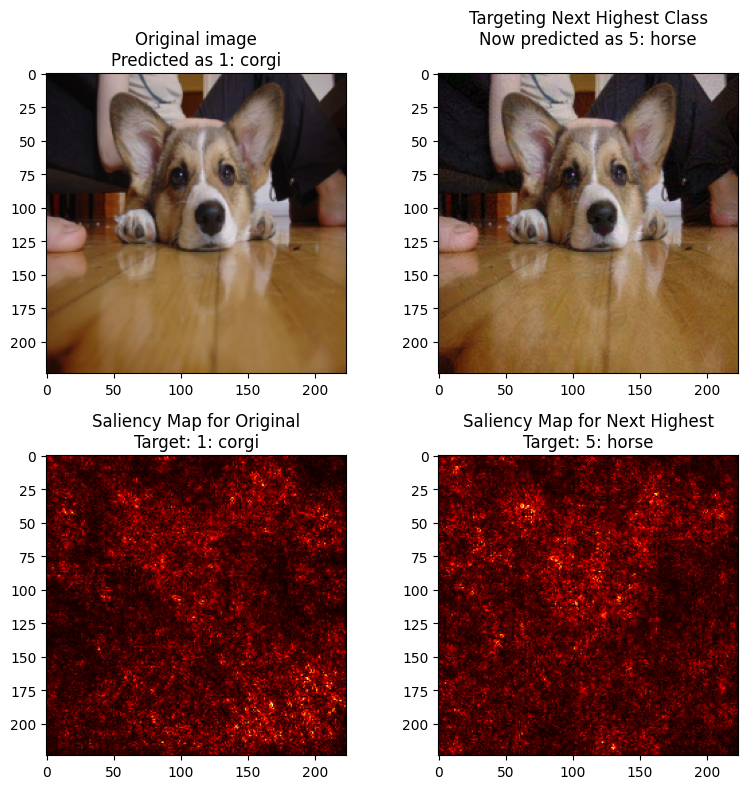

Original prediction: 1: corgi
Target classes:
  - Next highest: 5: horse

Results:
  - When targeting next highest class:
    - Final prediction: 5: horse


In [74]:

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
    
def get_class_name(idx):
        if class_names is not None and idx < len(class_names):
            return f"{idx}: {class_names[idx]}"
        return f"Class {idx}"

orig_img = image.squeeze(0).permute(1, 2, 0).cpu().numpy()
orig_img = orig_img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
orig_img = (orig_img * 255).clip(0, 255).astype('uint8')
    
axes[0, 0].imshow(orig_img)
axes[0, 0].set_title(f"Original image\nPredicted as {get_class_name(orig_pred_next)}")


mod_img = modified.squeeze(0).permute(1, 2, 0).cpu().numpy()
mod_img = mod_img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
mod_img = (mod_img * 255).clip(0, 255).astype('uint8')
    
axes[0, 1].imshow(mod_img)
axes[0, 1].set_title(f"Targeting Next Highest Class\nNow predicted as {get_class_name(final_pred_next)}\n")
     
    # Row 2: Saliency maps
axes[1, 0].imshow(compute_saliency_map(image, true_class, model=model_trained, device=device), cmap='hot')
axes[1, 0].set_title(f"Saliency Map for Original\nTarget: {get_class_name(true_class)}")
    
axes[1, 1].imshow(compute_saliency_map(modified, next_highest_class, model=model_trained, device=device), cmap='hot')
axes[1, 1].set_title(f"Saliency Map for Next Highest\nTarget: {get_class_name(next_highest_class)}")
    
  
plt.tight_layout()
plt.show()

print(f"Original prediction: {get_class_name(orig_pred_next)}")
print(f"Target classes:")
print(f"  - Next highest: {get_class_name(next_highest_class)}")
print("\nResults:")
print(f"  - When targeting next highest class:")
print(f"    - Final prediction: {get_class_name(final_pred_next)}")


In [77]:
def lowest(image, model=model_trained, device=device, num_epochs=10, learning_rate=0.01):

    input= image.clone().detach().cpu()

    model.eval()
    with torch.no_grad():
        image_tensor = input.unsqueeze(0).to(device)
        logits = model(image_tensor)
        probs = torch.nn.functional.softmax(logits, dim=1)[0] 
        true_class = torch.argsort(probs, descending=True)[0].item()
        lowest_class = torch.argsort(probs, descending=True)[-1].item() 

     
    modified_image = input.clone().to(device)
    modified_image.requires_grad_(True)
    
    with torch.no_grad():
        logits = model(modified_image.unsqueeze(0))
        original_pred = logits.argmax(dim=1).item()
    
    orig_min = input.min().item()
    orig_max = input.max().item()

    optimizer = torch.optim.Adam([modified_image], lr=learning_rate)
    
    for epoch in range(num_epochs):
        logits = model(modified_image.unsqueeze(0))
        loss = -logits[0, lowest_class]
        

        model.zero_grad()
        loss.backward()
        

        optimizer.step()
        
        # Optional
        with torch.no_grad():
            modified_image.clamp_(orig_min, orig_max)
    
    with torch.no_grad():
        logits = model(modified_image.unsqueeze(0))
        final_pred = logits.argmax(dim=1).item()
    
    return modified_image.detach(), original_pred, final_pred, true_class, lowest_class

import random 

image, label = selected_images[ random.choice(list(selected_images.keys()))]

modified, orig_pred_next, final_pred_next, true_class, lowest_class = lowest(image, model=model_trained, device=device, num_epochs=10)

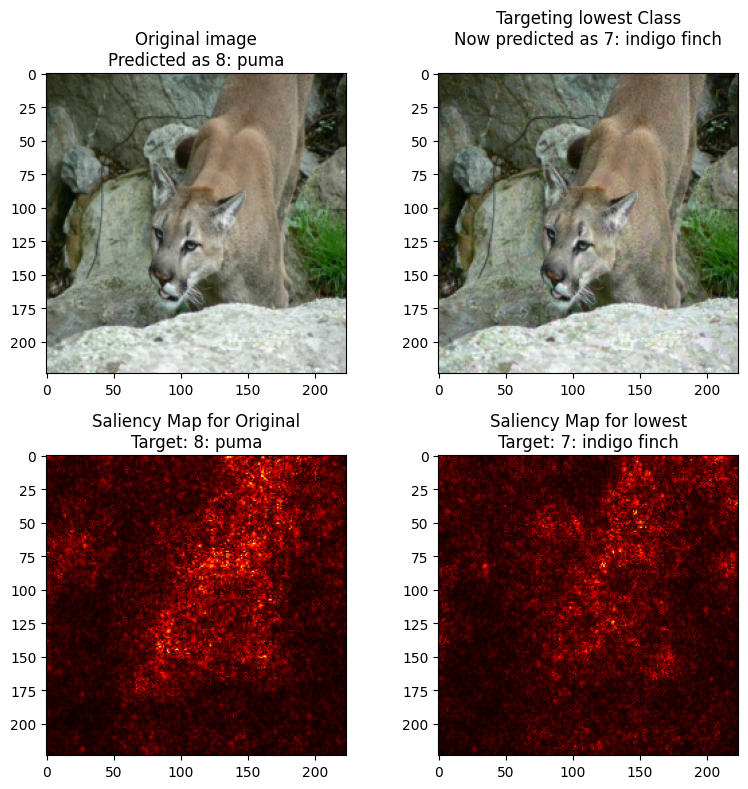

Original prediction: 8: puma
Target classes:
  - Lowest: 5: horse

Results:
  - When targeting lowest class:
    - Final prediction: 7: indigo finch


In [79]:

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
    
def get_class_name(idx):
        if class_names is not None and idx < len(class_names):
            return f"{idx}: {class_names[idx]}"
        return f"Class {idx}"

orig_img = image.squeeze(0).permute(1, 2, 0).cpu().numpy()
orig_img = orig_img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
orig_img = (orig_img * 255).clip(0, 255).astype('uint8')
    
axes[0, 0].imshow(orig_img)
axes[0, 0].set_title(f"Original image\nPredicted as {get_class_name(orig_pred_next)}")


mod_img = modified.squeeze(0).permute(1, 2, 0).cpu().numpy()
mod_img = mod_img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
mod_img = (mod_img * 255).clip(0, 255).astype('uint8')
    
axes[0, 1].imshow(mod_img)
axes[0, 1].set_title(f"Targeting lowest Class\nNow predicted as {get_class_name(final_pred_next)}\n")
     
    # Row 2: Saliency maps
axes[1, 0].imshow(compute_saliency_map(image, true_class, model=model_trained, device=device), cmap='hot')
axes[1, 0].set_title(f"Saliency Map for Original\nTarget: {get_class_name(true_class)}")
    
axes[1, 1].imshow(compute_saliency_map(modified, lowest_class, model=model_trained, device=device), cmap='hot')
axes[1, 1].set_title(f"Saliency Map for lowest\nTarget: {get_class_name(lowest_class)}")
    
  
plt.tight_layout()
plt.show()

print(f"Original prediction: {get_class_name(orig_pred_next)}")
print(f"Target classes:")
print(f"  - Lowest: {get_class_name(next_highest_class)}")
print("\nResults:")
print(f"  - When targeting lowest class:")
print(f"    - Final prediction: {get_class_name(final_pred_next)}")
